In [1]:
import numpy as np
from ldpc.bposd_decoder import BpOsdDecoder
from ldpc.bplsd_decoder import BpLsdDecoder
from ldpc.bp_decoder import BpDecoder
from tqdm import tqdm
from scipy.sparse import csc_matrix
import stim
from typing import List, FrozenSet, Dict
import pandas as pd
import warnings
# from decoder import SSFDecoder
import matplotlib.pyplot as plt
import itertools


In [2]:
import sys 
import os

# Get absolute path to ../src (the folder containing qldpc_circuit)
src_path = os.path.abspath(os.path.join(os.path.dirname('/Users/ariannameinking/Documents/Brown_Research/quits/docs/ssf_test.ipynb'), '..', 'src'))

if src_path not in sys.path:
    sys.path.insert(0, src_path)


from quits.qldpc_code import *
from quits.circuit import get_qldpc_mem_circuit
from quits.simulation import get_stim_mem_result
from quits.decoder import SSFDecoder
from quits.ldpc_utility import *

Test the SSF on different HGP codes. First is surface code

In [3]:
n = 3
dv = 2 # 2(n-1)/n
dc = 2

H = generate_ldpc(n, dv, dc)

print("Original parity-check matrix H:")
print(H)


rounds = 100
print(f"\nOptimizing for {rounds} rounds...")
H = optimize_ldpc(H, rounds, max_depth=10)

# Continue optimizing until constraints are satisfied
while has_duplicate_edges(H) or binary_matrix_rank(H) < H.shape[0]:
    
    # Additional optimization rounds
    rounds = 10
    print(f"\nOptimizing for another {rounds} rounds...")
    H = optimize_ldpc(H, rounds, max_depth=10)

# Display the final optimized parity-check matrix
print(f"\nOptimized parity-check matrix H (rank {binary_matrix_rank(H)}):")
print(H)

Original parity-check matrix H:
[[1 1 0]
 [1 1 0]
 [0 0 2]]

Optimizing for 100 rounds...
(2, 1),(4, 1) -> (6, 1),(6, 1)

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 rounds...

Optimizing for another 10 r

KeyboardInterrupt: 

In [4]:
H = np.array([[1,1,0],[0,1,1]])

code = HgpCode(H, H)
code.build_graph(seed=1)
print(code.hz)

[[1 0 0 1 0 0 0 0 0 1 0 0 0]
 [0 1 0 0 1 0 0 0 0 1 1 0 0]
 [0 0 1 0 0 1 0 0 0 0 1 0 0]
 [0 0 0 1 0 0 1 0 0 0 0 1 0]
 [0 0 0 0 1 0 0 1 0 0 0 1 1]
 [0 0 0 0 0 1 0 0 1 0 0 0 1]]


In [3]:
def generate_single_errors(h):
    """
    Generate a list of single errors based on the parity check matrix h.

    :param h: Parity check matrix
    :return: List of single errors
    """
    num_qubits = h.shape[1]
    single_errors = np.eye(num_qubits, dtype=int)
    return single_errors

In [5]:
# I guess I will just make my own parity check matrix bc hanwen is not responding
# H = np.array([[1,1,0,1,1,0,0,0,0],[0,0,1,0,0,1,0,0,0],[0,0,0,1,0,0,1,0,0],[0,0,0,0,1,1,0,1,1]])
# print(H)

single_errors = generate_single_errors(code.hz)
print("Single errors:")
print(single_errors)

Single errors:
[[1 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1]]


In [19]:
def get_SSF_error_matrix(H, max_num_error=None):
        """
        Find the valid errors of type given by error_type.

        :param error_type: the type of error to be considered. 'X' for X errors, 'Z' for Z errors
        :param max_num_error: the maximum number of simultaneous single qubit errors allowed

        :return: F - the matrix of allowable errors and, syndrome_F - the syndromes they generate
        """


        # Set to store unique errors efficiently
        error_indices_set = set()

        for i in range(H.shape[0]):
            supp = H[i].nonzero()[0]  # indices of i-th stabilizer generator's support
            print("first stabilizer indices:", supp)
            if max_num_error is None: max_num_error = len(supp)
            
            # Generate all combinations of indices of the support of the i-th stabilizer generator
            indices = []
            for j in range(1,max_num_error+1):
                indices += list(itertools.combinations(range(len(supp)), j))
            print("indices of the support of the i-th stabilizer generator:", indices)
            errors = np.zeros((len(indices), len(supp)), dtype=int)
            for i, idx in enumerate(indices):
                errors[i, list(idx)] = 1
            print("all possible errors matrix:", errors)
            # apply all the possible combinations of errors to the support of the i-th stabilizer generator
            for error in errors:
                if tuple(supp[error.astype(bool)]) not in error_indices_set:
                    error_indices_set.add(tuple(supp[error.astype(bool)]))
            print("error indices set:", error_indices_set)

        # generate the possible error matrix
        F = np.zeros((len(error_indices_set), H.shape[1]), dtype=int)
        for j in range(F.shape[0]):
            error_indices = error_indices_set.pop()
            F[j, error_indices] = 1
        print("F matrix:", F)
        
        # generate all the syndromes for H and F
        syndromes_F = (F @ H.T)%2
        return F, syndromes_F

H = code.hz
F, syndromes_F = get_SSF_error_matrix(H)
print("F matrix:")
print(F)

first stabilizer indices: [0 3 9]
indices of the support of the i-th stabilizer generator: [(0,), (1,), (2,), (0, 1), (0, 2), (1, 2), (0, 1, 2)]
all possible errors matrix: [[1 0 0]
 [0 1 0]
 [0 0 1]
 [1 1 0]
 [1 0 1]
 [0 1 1]
 [1 1 1]]
error indices set: {(0, 3), (0, 9), (3, 9), (0, 3, 9), (0,), (3,), (9,)}
first stabilizer indices: [ 1  4  9 10]
indices of the support of the i-th stabilizer generator: [(0,), (1,), (2,), (3,), (0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3), (0, 1, 2), (0, 1, 3), (0, 2, 3), (1, 2, 3)]
all possible errors matrix: [[1 0 0 0]
 [0 1 0 0]
 [0 0 1 0]
 [0 0 0 1]
 [1 1 0 0]
 [1 0 1 0]
 [1 0 0 1]
 [0 1 1 0]
 [0 1 0 1]
 [0 0 1 1]
 [1 1 1 0]
 [1 1 0 1]
 [1 0 1 1]
 [0 1 1 1]]
error indices set: {(4, 9), (4, 9, 10), (0, 3, 9), (1, 9), (1, 9, 10), (4,), (1,), (3, 9), (10,), (9, 10), (1, 4, 10), (0,), (3,), (9,), (4, 10), (0, 3), (0, 9), (1, 4), (1, 4, 9), (1, 10)}
first stabilizer indices: [ 2  5 10]
indices of the support of the i-th stabilizer generator: [(0,), (1

In [6]:
p = 0
log_errors_list = []
for i in range(single_errors.shape[0]):
    error = single_errors[i]
    syndrome = (error@code.hz.T)%2
    SSF_decoder = SSFDecoder(code, p, "X", 1)
    decoded_error = SSF_decoder.decode(syndrome)
    lx_pred = SSF_decoder.logical_error((decoded_error + error)%2)
    if np.any(lx_pred):
        print(f"log error at iteration {i}")
        log_errors_list += [i]

# [[1 0 0 1 0 0 0 0 0 1 0 0 0]
#  [0 1 0 0 1 0 0 0 0 1 1 0 0]
#  [0 0 1 0 0 1 0 0 0 0 1 0 0]
#  [0 0 0 1 0 0 1 0 0 0 0 1 0]
#  [0 0 0 0 1 0 0 1 0 0 0 1 1] 111-,
#  [0 0 0 0 0 1 0 0 1 0 0 0 1]] 1111       

error_arr [[0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1]
 [0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0]]
syndrome_arr [[0 0 0 1 0 0]
 [0 0 0 0 1 1]
 [0 0 1 0 0 0]
 [0 0 1 0 0 1]
 [0 0 0 1 1 0]
 [0 0 0 0 0 1]
 [0 1 0 0 1 0]
 [0 1 0 0 0 0]
 [0 0 0 0 1 0]
 [0 1 1 0 0 0]
 [1 0 0 0 0 0]
 [1 0 0 1 0 0]
 [1 1 0 0 0 0]]
error_arr [[0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 1]
 [0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [1 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0]]
syndrome_arr [[

In [9]:
p = 0

log_errors_list = []
p_list = np.logspace(-2, -1, 6)
pL_list = []

num_trials_list = np.array([1000, 800, 800, 500, 300, 100],dtype=int)

for i, p in enumerate(p_list):
    for _ in range(num_trials_list[i]):
        print(f"p = {p}, trial {_+1}/{num_trials_list[i]}")
        error = np.random.rand(code.hz.shape[1]) < p
        syndrome = (error@code.hz.T)%2
        SSF_decoder = SSFDecoder(code, p, "X")
        decoded_error = SSF_decoder.decode(syndrome)
        lz_pred = SSF_decoder.logical_error((decoded_error + error)%2)
        # print(lz_pred)
        log_errors_list += [np.any(lz_pred)]
    pL_list += [sum(log_errors_list)/num_trials_list[i]]

p = 0.01, trial 1/1000
error_arr [[0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 1 0 0 0]
 [0 0 0 0 1 0 0 0 0 1 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 1 0 0 0 0 1 0 0]
 [0 0 1 0 0 1 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 1 1]
 [1 0 0 1 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 1]
 [0 0 1 0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 1 0 0 0 0 1]
 [0 1 0 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 1 0]
 [0 0 0 0 1 0 0 0 0 0 0 1 1]
 [0 1 0 0 0 0 0 0 0 1 1 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 1 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 1 1 0 0]
 [0 0 0 0 1 0 0 1 0 0 0 1 0]
 [0 1 0 0 1 0 0 0 0 0 1 0 0]
 [0 0 1 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 1]
 [1 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 

Effective distance:  [3.9972148776335583]


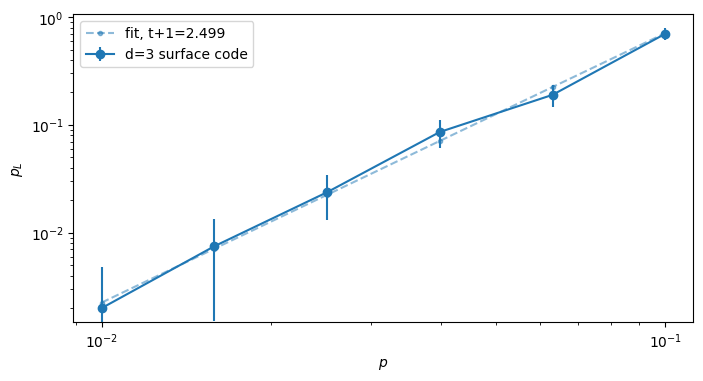

In [10]:
fit_L = []
fig, ax = plt.subplots(1, figsize=(8,4))
# pL_list= log_errors_list

mask = np.array(pL_list) > 0

p_list = np.array(p_list)
pL_list = np.array(pL_list)

fit_L += [np.polyfit(np.log10(p_list[mask]), np.log10(pL_list[mask]), 1)]

ax.errorbar(p_list[mask], pL_list[mask], yerr=1.96*np.sqrt(pL_list[mask]*(1 - pL_list[mask])/num_trials_list[mask]), ls='-', fmt='o', label=f"d=3 surface code")#, color='tab:blue')
ax.plot(p_list[mask], 10**fit_L[0][1] * p_list[mask]**fit_L[0][0], '.--', label='fit, t+1=%.3f'%fit_L[0][0], alpha=0.5, color = ax.get_lines()[-1].get_color()) #, color='tab:blue'

eff_dist_L = [2*fit[0] - 1 for fit in fit_L]
print('Effective distance: ', eff_dist_L)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel(r'$p$')
ax.set_ylabel(r'$p_L$')
ax.legend();